# Import libraries and open data

In [11]:
import torch

from default import *
%cd -q {PROJECT_HOME}

from dataset import DummyTrussDataset
from sklearn.experimental import enable_halving_search_cv
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import HalvingRandomSearchCV, cross_validate, KFold

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Set dataset dirs
train_dataset_dir = r"data/dataset/dummy_truss"
val_dataset_dir = r"data/dataset/dummy_truss"

In [15]:
def convert_dataset(filepath, noise=0):
    ds = DummyTrussDataset(filepath,
                           f_noise_loads=lambda size: np.random.normal(1, noise / 2, size),
                           f_noise_displacement=lambda size: np.random.normal(1, noise / 2, size),
                           f_noise_strain=lambda size: np.random.normal(1, noise / 2, size)
                           )

    X = []
    y = []

    for data in ds:
        x_i, y_i, _, _, _, _ = data
        X.append(x_i)
        y.append(y_i)

    return np.array(X), np.array(y)


X_train, y_train = convert_dataset(f"{train_dataset_dir}/val_8192.hdf5")
X_validation, y_validation = convert_dataset(f"{val_dataset_dir}/val_512.hdf5")

#X_train = np.hstack((X_train, 1 / X_train[:, :5]))
#X_validation = np.hstack((X_validation, 1 / X_validation[:, :5]))

# Regression

In [16]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error, make_scorer
from scipy.stats import loguniform, uniform
import numpy as np

# Define pipeline
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=0.95)),
    ('regression', LinearRegression())
])

# Define search space
param_distributions = {
    'pca__n_components': uniform(0, 1)
}

# Halving Random Search CV
search = HalvingRandomSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_percentage_error",
    n_candidates=1000,
    factor=3,
    random_state=42,
    cv=10,
    n_jobs=-1
)

# Fit the search
search.fit(X_train, y_train)

# Best model
best_pipeline = search.best_estimator_

# Predict
y_train_pred = best_pipeline.predict(X_train)
y_val_pred = best_pipeline.predict(X_validation)


# Metrics function
def compute_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true * 1e-6, y_pred * 1e-6)  # MSE in millions
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return r2, mse, rmse, mape


best_regression_model = best_pipeline

# Compute metrics
r2_train, mse_train, rmse_train, mape_train = compute_metrics(y_train, y_train_pred)
r2_val, mse_val, rmse_val, mape_val = compute_metrics(y_validation, y_val_pred)

# Print results
print("=== BEST HYPERPARAMETERS ===")
print(search.best_params_)

print("\n=== TRAIN SET ===")
print(f"R2     : {r2_train:.4f}")
print(f"MSE    : {mse_train:.4f} MN^2")
print(f"RMSE   : {rmse_train:.4f} MN^2")
print(f"MAPE   : {mape_train:.4%}")

print("\n=== VALIDATION SET ===")
print(f"R2     : {r2_val:.4f}")
print(f"MSE    : {mse_val:.4f} MN^2")
print(f"RMSE   : {rmse_val:.4f} MN")
print(f"MAPE   : {mape_val:.4%}")

=== BEST HYPERPARAMETERS ===
{'pca__n_components': 0.8631034258755935}

=== TRAIN SET ===
R2     : 0.1103
MSE    : 7751021.5000 MN^2
RMSE   : 2784.0657 MN^2
MAPE   : 110.3434%

=== VALIDATION SET ===
R2     : 0.0966
MSE    : 7869990.5000 MN^2
RMSE   : 2805.3503 MN
MAPE   : 116.0172%


# Ridge regression

In [4]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error, make_scorer
from scipy.stats import loguniform, uniform
import numpy as np

# Define pipeline
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=0.95)),
    ('regression', Ridge())
])

# Define search space
param_distributions = {
    'pca__n_components': uniform(0, 1),
    'regression__alpha': loguniform(1e-6, 1e4)
}

# Halving Random Search CV
search = HalvingRandomSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_percentage_error",
    n_candidates=1000,
    factor=3,
    random_state=42,
    cv=10,
    n_jobs=-1
)

# Fit the search
search.fit(X_train, y_train)

# Best model
best_pipeline = search.best_estimator_

# Predict
y_train_pred = best_pipeline.predict(X_train)
y_val_pred = best_pipeline.predict(X_validation)


# Metrics function
def compute_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true * 1e-6, y_pred * 1e-6)  # MSE in millions
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return r2, mse, rmse, mape


best_ridge_model = best_pipeline

# Compute metrics
r2_train, mse_train, rmse_train, mape_train = compute_metrics(y_train, y_train_pred)
r2_val, mse_val, rmse_val, mape_val = compute_metrics(y_validation, y_val_pred)

# Print results
print("=== BEST HYPERPARAMETERS ===")
print(search.best_params_)

print("\n=== TRAIN SET ===")
print(f"R2     : {r2_train:.4f}")
print(f"MSE    : {mse_train:.4f} MN^2")
print(f"RMSE   : {rmse_train:.4f} MN^2")
print(f"MAPE   : {mape_train:.4%}")

print("\n=== VALIDATION SET ===")
print(f"R2     : {r2_val:.4f}")
print(f"MSE    : {mse_val:.4f} MN^2")
print(f"RMSE   : {rmse_val:.4f} MN")
print(f"MAPE   : {mape_val:.4%}")

=== BEST HYPERPARAMETERS ===
{'pca__n_components': np.float64(0.9941393612211675), 'regression__alpha': np.float64(4.1532865770680765)}

=== TRAIN SET ===
R2     : 0.2752
MSE    : 6314733.5000 MN^2
RMSE   : 2512.9133 MN^2
MAPE   : 103.1263%

=== VALIDATION SET ===
R2     : 0.2591
MSE    : 6454219.0000 MN^2
RMSE   : 2540.5154 MN
MAPE   : 106.5836%


# Lasso

In [5]:
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import Lasso
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from scipy.stats import loguniform
import numpy as np

# Define pipeline with Lasso instead of Ridge
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=0.95)),
    ('regression', Lasso(max_iter=10000))
])

# Define hyperparameter search space
param_distributions = {
    'pca__n_components': uniform(0, 1),
    'regression__alpha': loguniform(1e-6, 1e4)
}

# Halving Random Search CV optimizing for MAPE
search = HalvingRandomSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_percentage_error",
    n_candidates=1000,
    factor=3,
    random_state=42,
    cv=10,
    n_jobs=-1
)

# Fit the model
search.fit(X_train, y_train)

# Best model
best_pipeline = search.best_estimator_

# Predict
y_train_pred = best_pipeline.predict(X_train)
y_val_pred = best_pipeline.predict(X_validation)


# Evaluation metrics
def compute_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true * 1e-6, y_pred * 1e-6)  # MSE in MN²
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return r2, mse, rmse, mape


best_lasso_model = best_pipeline

# Compute train/val metrics
r2_train, mse_train, rmse_train, mape_train = compute_metrics(y_train, y_train_pred)
r2_val, mse_val, rmse_val, mape_val = compute_metrics(y_validation, y_val_pred)

# Display results
print("=== BEST HYPERPARAMETERS ===")
print(search.best_params_)

print("\n=== TRAIN SET ===")
print(f"R2     : {r2_train:.4f}")
print(f"MSE    : {mse_train:.4f} MN²")
print(f"RMSE   : {rmse_train:.4f} MN")
print(f"MAPE   : {mape_train:.4%}")

print("\n=== VALIDATION SET ===")
print(f"R2     : {r2_val:.4f}")
print(f"MSE    : {mse_val:.4f} MN²")
print(f"RMSE   : {rmse_val:.4f} MN")
print(f"MAPE   : {mape_val:.4%}")


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.836e+16, tolerance: 1.144e+16
  model = cd_fast.enet_coordinate_descent(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.302e+19, tolerance: 1.704e+16
  model = cd_fast.enet_coordinate_descent(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

=== BEST HYPERPARAMETERS ===
{'pca__n_components': np.float64(0.8738900775625152), 'regression__alpha': np.float64(0.9421737967635988)}

=== TRAIN SET ===
R2     : 0.1650
MSE    : 7274749.0000 MN²
RMSE   : 2697.1743 MN
MAPE   : 108.3242%

=== VALIDATION SET ===
R2     : 0.1479
MSE    : 7422815.0000 MN²
RMSE   : 2724.4844 MN
MAPE   : 114.4249%


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.862e+22, tolerance: 7.137e+18
  model = cd_fast.enet_coordinate_descent(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.844e+22, tolerance: 7.137e+18
  model = cd_fast.enet_coordinate_descent(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

In [6]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from scipy.stats import randint, uniform
import numpy as np

# Define the pipeline
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=0.95)),
    ('regression', RandomForestRegressor(random_state=42))
])

# Define hyperparameter search space
param_distributions = {
    'pca__n_components': uniform(0.8, 0.2),  # tries values between 0.8 and 1.0
    'regression__n_estimators': randint(50, 300),
    'regression__max_depth': randint(5, 50),
    'regression__min_samples_split': randint(2, 10),
    'regression__min_samples_leaf': randint(1, 5)
}

# Define and run the HalvingRandomSearchCV
search = HalvingRandomSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_percentage_error",
    n_candidates=1000,
    factor=3,
    random_state=42,
    cv=10,
    n_jobs=-1,
    verbose=1  # optional, to monitor progress
)

# Fit the model
search.fit(X_train, y_train)

# Get best model
best_pipeline = search.best_estimator_

# Predict
y_train_pred = best_pipeline.predict(X_train)
y_val_pred = best_pipeline.predict(X_validation)


# Evaluation metrics
def compute_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true * 1e-6, y_pred * 1e-6)  # MSE in MN²
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return r2, mse, rmse, mape


best_forest_model = best_pipeline

# Compute metrics
r2_train, mse_train, rmse_train, mape_train = compute_metrics(y_train, y_train_pred)
r2_val, mse_val, rmse_val, mape_val = compute_metrics(y_validation, y_val_pred)

# Print results
print("=== BEST HYPERPARAMETERS ===")
print(search.best_params_)

print("\n=== TRAIN SET ===")
print(f"R2     : {r2_train:.4f}")
print(f"MSE    : {mse_train:.4f} MN²")
print(f"RMSE   : {rmse_train:.4f} MN")
print(f"MAPE   : {mape_train:.4%}")

print("\n=== VALIDATION SET ===")
print(f"R2     : {r2_val:.4f}")
print(f"MSE    : {mse_val:.4f} MN²")
print(f"RMSE   : {rmse_val:.4f} MN")
print(f"MAPE   : {mape_val:.4%}")


n_iterations: 6
n_required_iterations: 7
n_possible_iterations: 6
min_resources_: 20
max_resources_: 8192
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1000
n_resources: 20
Fitting 10 folds for each of 1000 candidates, totalling 10000 fits
----------
iter: 1
n_candidates: 334
n_resources: 60
Fitting 10 folds for each of 334 candidates, totalling 3340 fits
----------
iter: 2
n_candidates: 112
n_resources: 180
Fitting 10 folds for each of 112 candidates, totalling 1120 fits
----------
iter: 3
n_candidates: 38
n_resources: 540
Fitting 10 folds for each of 38 candidates, totalling 380 fits


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 4
n_candidates: 13
n_resources: 1620
Fitting 10 folds for each of 13 candidates, totalling 130 fits
----------
iter: 5
n_candidates: 5
n_resources: 4860
Fitting 10 folds for each of 5 candidates, totalling 50 fits
=== BEST HYPERPARAMETERS ===
{'pca__n_components': np.float64(0.9972421488959207), 'regression__max_depth': 21, 'regression__min_samples_leaf': 1, 'regression__min_samples_split': 2, 'regression__n_estimators': 294}

=== TRAIN SET ===
R2     : 0.9629
MSE    : 323610.5580 MN²
RMSE   : 568.8678 MN
MAPE   : 9.8393%

=== VALIDATION SET ===
R2     : 0.7328
MSE    : 2327296.5627 MN²
RMSE   : 1525.5480 MN
MAPE   : 27.0004%


In [7]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsRegressor
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from scipy.stats import randint, uniform
import numpy as np

# Define the pipeline
pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('pca', PCA(n_components=0.95)),
    ('regression', KNeighborsRegressor())
])

# Define hyperparameter search space
param_distributions = {
    'pca__n_components': uniform(0.8, 0.2),  # n_components in [0.8, 1.0]
    'regression__n_neighbors': randint(1, 50),
    'regression__weights': ['uniform', 'distance'],
    'regression__p': [1, 2]  # 1 = Manhattan, 2 = Euclidean
}

# Halving Random Search
search = HalvingRandomSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_percentage_error",
    n_candidates=1000,
    factor=3,
    random_state=42,
    cv=10,
    n_jobs=-1,
    verbose=1  # Optional: see progress
)

# Fit the model
search.fit(X_train, y_train)

# Best model
best_pipeline = search.best_estimator_

# Predict
y_train_pred = best_pipeline.predict(X_train)
y_val_pred = best_pipeline.predict(X_validation)


# Evaluation metrics
def compute_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true * 1e-6, y_pred * 1e-6)  # MSE in MN²
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return r2, mse, rmse, mape


# Optional: save model for later
best_knn_model = best_pipeline

# Compute metrics
r2_train, mse_train, rmse_train, mape_train = compute_metrics(y_train, y_train_pred)
r2_val, mse_val, rmse_val, mape_val = compute_metrics(y_validation, y_val_pred)

# Print results
print("=== BEST HYPERPARAMETERS ===")
print(search.best_params_)

print("\n=== TRAIN SET ===")
print(f"R2     : {r2_train:.4f}")
print(f"MSE    : {mse_train:.4f} MN²")
print(f"RMSE   : {rmse_train:.4f} MN")
print(f"MAPE   : {mape_train:.4%}")

print("\n=== VALIDATION SET ===")
print(f"R2     : {r2_val:.4f}")
print(f"MSE    : {mse_val:.4f} MN²")
print(f"RMSE   : {rmse_val:.4f} MN")
print(f"MAPE   : {mape_val:.4%}")


n_iterations: 6
n_required_iterations: 7
n_possible_iterations: 6
min_resources_: 20
max_resources_: 8192
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 1000
n_resources: 20
Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:982: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 971, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 279, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 371, in _score
    y_pred = method_caller(
     

----------
iter: 1
n_candidates: 334
n_resources: 60
Fitting 10 folds for each of 334 candidates, totalling 3340 fits


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [        nan         nan -2.01825692 ... -0.92167441 -0.86049573
 -0.86030743]
  warnings.warn(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the train scores are non-finite: [            nan             nan -7.13605708e-06 ...  0.00000000e+00
 -1.35341147e-17  0.00000000e+00]
  warnings.warn(


----------
iter: 2
n_candidates: 112
n_resources: 180
Fitting 10 folds for each of 112 candidates, totalling 1120 fits


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [        nan         nan -2.01825692 ... -0.61500661 -0.61500661
 -0.61500661]
  warnings.warn(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the train scores are non-finite: [            nan             nan -7.13605708e-06 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
  warnings.warn(


----------
iter: 3
n_candidates: 38
n_resources: 540
Fitting 10 folds for each of 38 candidates, totalling 380 fits


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [        nan         nan -2.01825692 ... -0.53856308 -0.56500866
 -0.56500866]
  warnings.warn(
/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [        nan         nan -2.01825692 ... -0.43337807 -0.43337807
 -0.4327447 ]
  warnings.warn(


----------
iter: 4
n_candidates: 13
n_resources: 1620
Fitting 10 folds for each of 13 candidates, totalling 130 fits
----------
iter: 5
n_candidates: 5
n_resources: 4860
Fitting 10 folds for each of 5 candidates, totalling 50 fits
=== BEST HYPERPARAMETERS ===
{'pca__n_components': np.float64(0.9667299923875172), 'regression__n_neighbors': 3, 'regression__p': 2, 'regression__weights': 'distance'}

=== TRAIN SET ===
R2     : 1.0000
MSE    : 0.0000 MN²
RMSE   : 0.0002 MN
MAPE   : 0.0000%

=== VALIDATION SET ===
R2     : 0.6334
MSE    : 3193999.9892 MN²
RMSE   : 1787.1765 MN
MAPE   : 29.1796%


/Users/aflamant/miniconda3/envs/x86Memoire/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [        nan         nan -2.01825692 ... -0.33941624 -0.33941624
 -0.3428308 ]
  warnings.warn(


# Plot

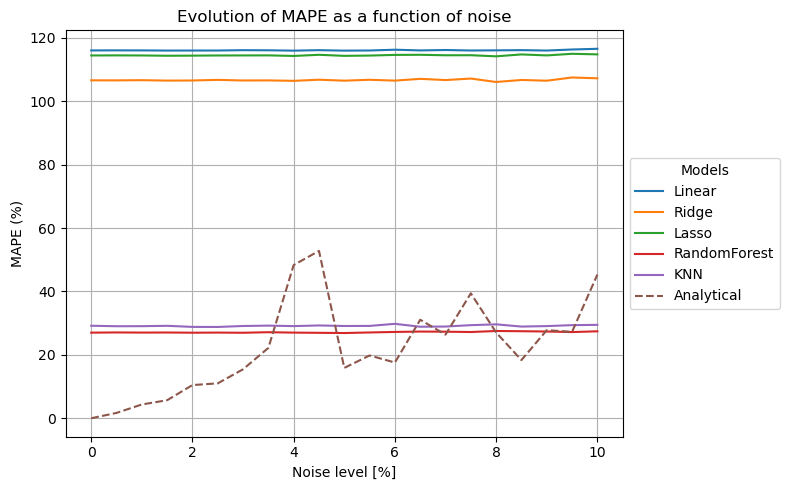

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Define the noise levels
noise_levels = np.linspace(0, 0.1, 21)

# Store metrics for each model
model_names = ['Linear', 'Ridge', 'Lasso', 'RandomForest', 'KNN']
models = [best_regression_model, best_ridge_model, best_lasso_model, best_forest_model, best_knn_model]

r2_scores = {name: [] for name in model_names}
rmse_scores = {name: [] for name in model_names}
mape_scores = {name: [] for name in model_names}

# Load and evaluate each model on noisy validation data
for noise in noise_levels:
    X_val_noisy, y_val_noisy = convert_dataset(f"{val_dataset_dir}/val_512.hdf5", noise=noise)

    for name, model in zip(model_names, models):
        y_pred = model.predict(X_val_noisy)

        r2 = r2_score(y_val_noisy, y_pred)
        mse = mean_squared_error(y_val_noisy * 1e-6, y_pred * 1e-6)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(y_val_noisy, y_pred)

        r2_scores[name].append(r2)
        rmse_scores[name].append(rmse)
        mape_scores[name].append(mape)

# === Plotting ===
fig, ax = plt.subplots(figsize=(8, 5))  # Wider figure for space

# MAPE Plot
for name in model_names:
    ax.plot(noise_levels * 100, np.array(mape_scores[name]) * 100, label=name)

# Analytical benchmark
analytical_results = np.loadtxt(r'experiments/dummy_truss/analytical_mean_mape.dat')
ax.plot(noise_levels * 100, analytical_results * 100, linestyle='--', label="Analytical")

# Labels and formatting
ax.set_ylabel("MAPE (%)")
ax.set_title("Evolution of MAPE as a function of noise")
ax.set_xlabel("Noise level [%]")
ax.grid(True)

# Move legend outside the plot
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title="Models")

plt.tight_layout()  # Make room for legend

# Save
fig.savefig(r"experiments/dummy_truss/03_truss_example_classical_model_noise_mape.pdf")

plt.show()
